# POS Tagger Trained on the UD Treebank

Adapted from https://github.com/soutsios/pos_tagger_mlp/blob/master/pos_tagger_mlp.ipynb 

In [1]:
import pyconll, nltk, datetime, warnings
import numpy as np
from scipy.sparse import vstack
import matplotlib.pyplot as plt
from sklearn.feature_extraction import DictVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, f1_score
from sklearn.model_selection import StratifiedKFold, GridSearchCV, learning_curve
from sklearn.exceptions import UndefinedMetricWarning
warnings.filterwarnings(action='ignore', category=UndefinedMetricWarning)
from numpy.random import seed

# Plot Functions

These functions are useful to visualize the training dynamics of the learning algorithm and the confusion matrix of the trained models.

In [2]:
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Accuracy")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring='accuracy')
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

In [3]:
def plot_confusion_matrix(f1,
                          cm,
                          target_names,
                          title='Confusion matrix',
                          cmap=None,
                          normalize=True,
                          i=1):
    """
    given a sklearn confusion matrix (cm), make a nice plot

    Arguments
    ---------
    cm:           confusion matrix from sklearn.metrics.confusion_matrix

    target_names: given classification classes such as [0, 1, 2]
                  the class names, for example: ['high', 'medium', 'low']

    title:        the text to display at the top of the matrix

    cmap:         the gradient of the values displayed from matplotlib.pyplot.cm
                  see http://matplotlib.org/examples/color/colormaps_reference.html
                  plt.get_cmap('jet') or plt.cm.Blues

    normalize:    If False, plot the raw numbers
                  If True, plot the proportions

    Usage
    -----
    plot_confusion_matrix(cm           = cm,                  # confusion matrix created by
                                                              # sklearn.metrics.confusion_matrix
                          normalize    = True,                # show proportions
                          target_names = y_labels_vals,       # list of names of the classes
                          title        = best_estimator_name) # title of graph

    Citiation
    ---------
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html

    """
    import matplotlib.pyplot as plt
    import numpy as np
    import itertools

    accuracy = np.trace(cm) / float(np.sum(cm))
    misclass = 1 - accuracy
    plt.figure(figsize=(10, 6))
    if cmap is None:
        cmap = plt.get_cmap('Blues')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label\naccuracy={:0.4f}; misclass={:0.4f}; f1-score={:0.4f}'.format(accuracy, misclass, f1))

# Load Dataset

In [4]:
UD_ENGLISH_TRAIN = '../UD_English-EWT/en_ewt-ud-train.conllu'
UD_ENGLISH_DEV = '../UD_English-EWT/en_ewt-ud-dev.conllu'
UD_ENGLISH_TEST = '../UD_English-EWT/en_ewt-ud-test.conllu'

# Preprocessing

In [5]:
def read_conllu(path):
    data = pyconll.load_from_file(path)
    tagged_sentences=[]
    original_sentences=[]
    t=0
    for sentence in data:
        original_sentences.append(sentence.text)
        tagged_sentence=[]
        for token in sentence:
            if token.upos:
                t+=1
                tagged_sentence.append((token.form if token.form else '*None*', token.upos))
        tagged_sentences.append(tagged_sentence)
    return tagged_sentences, original_sentences

Load train, development and test set in the appropriate tagged format, tuple (word, pos-tag)

In [10]:
train_sentences, train_original = read_conllu(UD_ENGLISH_TRAIN)
val_sentences, val_original = read_conllu(UD_ENGLISH_DEV)
test_sentences, test_original = read_conllu(UD_ENGLISH_TEST)

Print statistics

In [11]:
print("Tagged sentences in train set: ", len(train_sentences))
print("Tagged words in train set:", len([item for sublist in train_sentences for item in sublist]))
print(40*'=')
print("Tagged sentences in dev set: ", len(val_sentences))
print("Tagged words in dev set:", len([item for sublist in val_sentences for item in sublist]))
print(40*'=')
print("Tagged sentences in test set: ", len(test_sentences))
print("Tagged words in test set:", len([item for sublist in test_sentences for item in sublist]))

Tagged sentences in train set:  12544
Tagged words in train set: 204616
Tagged sentences in dev set:  2001
Tagged words in dev set: 25153
Tagged sentences in test set:  2077
Tagged words in test set: 25096


In [12]:
print(train_sentences[0])

[('Al', 'PROPN'), ('-', 'PUNCT'), ('Zaman', 'PROPN'), (':', 'PUNCT'), ('American', 'ADJ'), ('forces', 'NOUN'), ('killed', 'VERB'), ('Shaikh', 'PROPN'), ('Abdullah', 'PROPN'), ('al', 'PROPN'), ('-', 'PUNCT'), ('Ani', 'PROPN'), (',', 'PUNCT'), ('the', 'DET'), ('preacher', 'NOUN'), ('at', 'ADP'), ('the', 'DET'), ('mosque', 'NOUN'), ('in', 'ADP'), ('the', 'DET'), ('town', 'NOUN'), ('of', 'ADP'), ('Qaim', 'PROPN'), (',', 'PUNCT'), ('near', 'ADP'), ('the', 'DET'), ('Syrian', 'ADJ'), ('border', 'NOUN'), ('.', 'PUNCT')]


In [13]:
def tag_sequence(sentences):
    return [[t for w, t in sentence] for sentence in sentences]

def text_sequence(sentences):
    return [[w for w, t in sentence] for sentence in sentences]

def id2word(sentences):
    wordlist = [item for sublist in text_sequence(sentences) for item in sublist]
    id2word = {k:v for k,v in enumerate(wordlist)}
    return id2word

def untag(tagged_sentence):
    return [w for w, _ in tagged_sentence]

def untag_pos(tagged_sentence):
    return [t for _, t in tagged_sentence]

def build_vocab(sentences):
    vocab =set()
    for sentence in sentences:
        for word in untag(sentence):
            vocab.add(word)
    return sorted(list(vocab))

An important observation: how many terms are in validation set and not found in train set? (This estimates the Out-of-vocabulary rate.)

In [14]:
list_1 = build_vocab(train_sentences)
list_2 = build_vocab(val_sentences)
diff_list = [item for item in list_2 if item not in list_1]
print('Number of terms not found in train set:',len(diff_list))

Number of terms not found in train set: 1661


# Feature Engineering

We use the "classical" machine learning approach: we will train a token classifier model. The classifier gets as input a feature vector describing each token in the sentence. We decide a priori which features are informative to make the tagging decision. In this case, we use a combination of "word shape" features which approximate morphological knowledge. We naturally also include lexical information (the token form itself), and some form of "syntactic knowledge" by adding reference to the previous and next word in each token feature vector.

In [15]:
def features_basic(sentence, index):
    """ sentence: [w1, w2, ...], index: the index of the word """
    return {
        'nb_terms': len(sentence),        
        'word': sentence[index],
        'word_lower': sentence[index].lower(),
        'is_first': index == 0,
        'is_last': index == len(sentence) - 1,
        'is_capitalized': sentence[index][0].upper() == sentence[index][0],
        'is_all_caps': sentence[index].upper() == sentence[index],
        'is_all_lower': sentence[index].lower() == sentence[index],
        'prefix-1': sentence[index][0],
        'prefix-2': sentence[index][:2],
        'prefix-3': sentence[index][:3],
        'suffix-1': sentence[index][-1],
        'suffix-2': sentence[index][-2:],
        'suffix-3': sentence[index][-3:],
        'i-1_prefix-3': '' if index == 0 else sentence[index-1][:3],        
        'i-1_suffix-3': '' if index == 0 else sentence[index-1][-3:],        
        'i+1_prefix-3': '' if index == len(sentence) - 1 else sentence[index+1][:3],        
        'i+1_suffix-3': '' if index == len(sentence) - 1 else sentence[index+1][-3:],        
        'prev_word': '' if index == 0 else sentence[index - 1].lower(),
        'next_word': '' if index == len(sentence) - 1 else sentence[index + 1].lower(),
        'has_hyphen': '-' in sentence[index],
        'is_numeric': sentence[index].isdigit(),
        'capitals_inside': sentence[index][1:].lower() != sentence[index][1:],
    }

In the scikit-learn model, we model a dataset as a pair of two data structures:
* The list of feature dictionaries X (one feature dictionary for each token)
* The list of predicted label y (one tag for each token)

In [16]:
def transform_to_dataset(tagged_sentences):
    X, y = [], []
    for doc_index, tagged in enumerate(tagged_sentences):
        for index in range(len(tagged)):
            X.append([features_basic(untag(tagged), index)])
            y.append(tagged[index][1])
    return X, y

Given a sentence represented as a list of tokens, return the list of feature dictionaries using our feature encoding method:

In [17]:
def transform_test_sentence(sentence):
    X = []
    for index in range(len(sentence)):
            X.append([features_basic(sentence, index)])
    return X

## Test untag()

We use untag() to extract raw sentences from the annotated CoNLL dataset. This way we can reproduce a sentence without tags, submit it to the tagger and compare predictions to the gold tags that are provided in the dataset.

In [18]:
untag(test_sentences[1])

['What',
 'if',
 'Google',
 'expanded',
 'on',
 'its',
 'search',
 '-',
 'engine',
 '(',
 'and',
 'now',
 'e-mail',
 ')',
 'wares',
 'into',
 'a',
 'full',
 '-',
 'fledged',
 'operating',
 'system',
 '?']

# Dataset Transformation

Before we can apply a generic machine learning algorithm (such as Logistic Regression), we need to encode the dataset into a vectorized format.

We proceed in two steps: feature engineering and vectorization.

For each token, we create a dictionary of features that depend on the sentence from which the token is extracted. 
These features include the word itself, the word before and the word after, letter suffixes and prefixes, etc.

In the scikit-learn approach, before we can use a generic machine learning algorithm, we must then "vectorize" the feature dictionaries into vector encodings.
For example, lexical features are encoded into one-hot vectors whose dimension is the size of the vocabulary.
Note the difference between the method `fit_transform` of the vectorizer, which "learns" how to vectorize features, and `transform` which applies a learned vectorizer to feature dictionaries.  We use `fit_transform` on the training data, and `transform` on the other sections (validation and test).

These vector representations are what is passed to the machine learning algorithm.

In [19]:
def vectorize(train, val, test):

    print('Feature encoding method')
    print('Vectorizing Dataset...')
    print('Vectorizing train...')
    X_train, y_train = transform_to_dataset(train)
    v = DictVectorizer(sparse=True) 
    X_train = v.fit_transform([x[0] for x in X_train])
    
    print('Vectorizing validation...')
    X_val, y_val = transform_to_dataset(val)
    X_val = v.transform([x[0] for x in X_val])        
    
    print('Vectorizing test...')
    X_test, y_test = transform_to_dataset(test)
    X_test = v.transform([x[0] for x in X_test])
    
    print('Dataset vectorized.')
    print('Train shape:', X_train.shape)
    print('Validation shape:', X_val.shape)
    print('Test shape:', X_test.shape)
    
    # Compress sparse matrices
    X_train = X_train 
    X_val = X_val 
    X_test = X_test
    return X_train, y_train, X_val, y_val, X_test, y_test, v
    

# Baseline Tagger

Before we train a "real" machine learning algorithm using scikit-learn, we will repeat the very simple statistical method we discussed in class.
We train and evaluate the Baseline Unigram tagger to compare performance with the tagger we will train next.

In [20]:
default_tagger = nltk.DefaultTagger('NOUN')
unigram_tagger = nltk.UnigramTagger(train_sentences+val_sentences, backoff=default_tagger)

In [21]:
y_train = [item for sublist in tag_sequence(train_sentences+val_sentences) for item in sublist]
y_test = [item for sublist in tag_sequence(test_sentences) for item in sublist]
classes = sorted(list(set(y_train)))

In [22]:
def tag_list(tagged_sents):
    return [tag for sent in tagged_sents for (word, tag) in sent]
def apply_tagger(tagger, corpus):
    return [tagger.tag(nltk.tag.untag(sent)) for sent in corpus]

In [23]:
y_pred = tag_list(apply_tagger(unigram_tagger, test_sentences))
print("Accuracy: {0:.4f}".format(unigram_tagger.accuracy(test_sentences)))
print('f1-macro score: {0:.4f}'.format(f1_score(y_test, y_pred, zero_division=1, average='macro')))

Accuracy: 0.8671
f1-macro score: 0.7965


In [24]:
print(classification_report(y_test, y_pred, zero_division=1, digits=4))

              precision    recall  f1-score   support

         ADJ     0.9158    0.8367    0.8745      1794
         ADP     0.8697    0.8813    0.8755      2030
         ADV     0.9341    0.8030    0.8636      1183
         AUX     0.9233    0.8970    0.9099      1543
       CCONJ     0.9892    0.9973    0.9932       736
         DET     0.9612    0.9678    0.9645      1896
        INTJ     0.9655    0.6942    0.8077       121
        NOUN     0.6879    0.9331    0.7920      4123
         NUM     0.9146    0.6125    0.7337       542
        PART     0.6959    0.9769    0.8128       649
        PRON     0.9665    0.9321    0.9490      2166
       PROPN     0.9240    0.5443    0.6851      2076
       PUNCT     0.9941    0.9861    0.9901      3096
       SCONJ     0.6257    0.5964    0.6107       384
         SYM     0.8125    0.8349    0.8235       109
        VERB     0.8880    0.8243    0.8549      2606
           X     1.0000    0.0000    0.0000        42

    accuracy              

See what errors the Baseline tagger makes:

In [25]:
def check_tagger(tagged_sentence):
    note = ''
    for tup in list(zip(unigram_tagger.tag(untag(tagged_sentence)),untag_pos(tagged_sentence))):
        if tup[0][1]!=tup[1]: note='<<--- Error!'
        print(tup[0], tup[1], note)
        note=''

In [26]:
check_tagger(test_sentences[1])

('What', 'PRON') PRON 
('if', 'SCONJ') SCONJ 
('Google', 'PROPN') PROPN 
('expanded', 'VERB') VERB 
('on', 'ADP') ADP 
('its', 'PRON') PRON 
('search', 'NOUN') NOUN 
('-', 'PUNCT') PUNCT 
('engine', 'NOUN') NOUN 
('(', 'PUNCT') PUNCT 
('and', 'CCONJ') CCONJ 
('now', 'ADV') ADV 
('e-mail', 'NOUN') NOUN 
(')', 'PUNCT') PUNCT 
('wares', 'NOUN') NOUN 
('into', 'ADP') ADP 
('a', 'DET') DET 
('full', 'ADJ') ADV <<--- Error!
('-', 'PUNCT') PUNCT 
('fledged', 'NOUN') ADJ <<--- Error!
('operating', 'NOUN') NOUN 
('system', 'NOUN') NOUN 
('?', 'PUNCT') PUNCT 


It makes mistakes. Unsurprising given its simplistic approach and the small size of the training data.

In [27]:
cnf_matrix = confusion_matrix(y_test, y_pred)
name='Baseline'

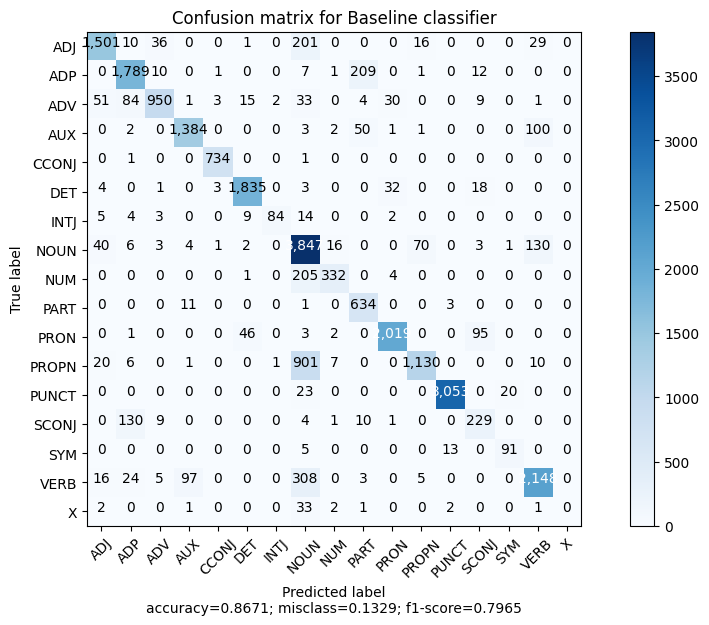

In [28]:
plot_confusion_matrix(f1_score(y_test, y_pred, average='macro'), cnf_matrix, target_names=classes, title='Confusion matrix for '+name+' classifier', normalize=False)

# Train a Logistic Regression Model

Let us move to a more serious machine learning model. We will train a Logistic Regression model using our feature extraction function based on our "expertise" in the domain.

We first transform the whole dataset from the CoNLL format into the scikit-learn vectorized encoding using our feature extraction method.

In [29]:
X_train, y_train, X_val, y_val, X_test, y_test, vec = vectorize(train_sentences, val_sentences, test_sentences)

Feature encoding method
Vectorizing Dataset...
Vectorizing train...
Vectorizing validation...
Vectorizing test...
Dataset vectorized.
Train shape: (204616, 98724)
Validation shape: (25153, 98724)
Test shape: (25096, 98724)


## Hyper-parameter Tuning

The Logistic Regression algorithm uses a hyper-parameter called C.  We tune the value of this parameter by testing different values on a subset of the training data and observing the impact of the C parameter on selected metrics (accuracy and F1).

Because we will use cross-validation, we can use the full train set (train + validation)

In [30]:
X_train = vstack((X_train, X_val))
y_train = np.append(y_train, y_val, axis=0)

In [31]:
X_train.shape

(229769, 98724)

In [32]:
y_train.shape

(229769,)

In [33]:
def hyper_tuning(train, test, y_train, y_test, scores, estimator, parameters, cv):
    print("# Estimator:",estimator)
    for score in scores:
        print("# Tuning hyper-parameters for %s" % score)        
        clf = GridSearchCV(estimator, parameters, cv=cv, scoring='%s' % score)
        clf.fit(train, y_train)
        print("Best parameters set found on development set:")
        print(clf.best_params_)
        print()
        print("Grid scores on development set:")
        means = clf.cv_results_['mean_test_score']
        stds = clf.cv_results_['std_test_score']
        for mean, std, params in zip(means, stds, clf.cv_results_['params']):
            print("%0.3f (+/-%0.03f) for %r" % (mean, std * 2, params))
        print()
        print("Detailed classification report:")
        print("The model is trained on the full development set.")
        print("The scores are computed on the full evaluation set.")
        y_pred = clf.predict(test)
        print(classification_report(y_test, y_pred, digits=4))
        print('Accuracy: {0:0.4f}   f1-score: {1:0.4f} \n'.format(accuracy_score(y_test, y_pred), f1_score(y_test, y_pred, average='macro')))
    return clf

In [34]:
# logregr = LogisticRegression(solver='liblinear', random_state=13)
# # Cross validation strategy
# skf = StratifiedKFold(n_splits=4)
# # Scores could also be ['precision', 'recall', ....]
# scores = ['accuracy', 'f1_macro']

# params = [{'C': [0.1, 1, 2, 3, 4, 5, 10, 20, 50]}]
# #logregr = hyper_tuning(X_train, X_test, y_train, y_test, scores, logregr, params, skf)
# #You may want to comment previous line and comment-out next lines to see how hyper-tuning works and dont wait too much time...
# skf = StratifiedKFold(n_splits=4)
# logregr = hyper_tuning(X_train[:500], X_test[:50], y_train[:500], y_test[:50], scores, logregr, params, skf)

## Training

We can now training using the best hyper-parameter selected above.  This takes a few minutes.

In [35]:
t_ini = datetime.datetime.now()
print('Training...')
clf = LogisticRegression(C=20, solver='liblinear', random_state=13)
clf.fit(X_train, y_train)
t_fin = datetime.datetime.now()
print('Training completed in {} seconds'.format((t_fin - t_ini).total_seconds()))

Training...
Training completed in 234.307899 seconds


# Evaluation

In [36]:
y_pred = clf.predict(X_test)

In [37]:
print("Accuracy: {0:.4f}".format(clf.score(X_test, y_test)))
print('f1-macro score: {0:.4f}'.format(f1_score(y_test, y_pred, average='macro')))

Accuracy: 0.9452
f1-macro score: 0.9041


## Classification Report

In [38]:
print(classification_report(y_test, clf.predict(X_test), digits=4))

              precision    recall  f1-score   support

         ADJ     0.9193    0.9013    0.9102      1794
         ADP     0.9333    0.9586    0.9458      2030
         ADV     0.9204    0.8893    0.9046      1183
         AUX     0.9781    0.9819    0.9799      1543
       CCONJ     0.9946    0.9932    0.9939       736
         DET     0.9915    0.9900    0.9908      1896
        INTJ     0.9712    0.8347    0.8978       121
        NOUN     0.9036    0.9209    0.9122      4123
         NUM     0.9743    0.9797    0.9770       542
        PART     0.9799    0.9769    0.9784       649
        PRON     0.9862    0.9875    0.9869      2166
       PROPN     0.8824    0.8603    0.8712      2076
       PUNCT     0.9916    0.9971    0.9944      3096
       SCONJ     0.8544    0.8099    0.8316       384
         SYM     0.8990    0.8165    0.8558       109
        VERB     0.9451    0.9574    0.9512      2606
           X     0.5200    0.3095    0.3881        42

    accuracy              

## Frequent Types of Mistakes

In [39]:
import collections
k=0
i2w = id2word(test_sentences)
error_counter = collections.Counter()
for i in range(X_test.shape[0]):
    correct_tag_id = y_test
    if y_pred[i]!=y_test[i]:
        k += 1
        word = i2w[i]
        error_counter[word] += 1
print('Accuracy: {0:.4f}'.format((len(i2w)-k)/len(i2w)))
print('Total errors/Total words: {}/{}\n'.format(k,len(i2w)))
print('Most common errors:',error_counter.most_common(20))

Accuracy: 0.9452
Total errors/Total words: 1375/25096

Most common errors: [('that', 25), ('as', 23), ('to', 23), ('like', 22), ('out', 18), ('for', 18), ('up', 18), ('/', 17), ('in', 17), ('on', 12), ('01-Feb-02', 11), ('much', 10), ('one', 9), ('-', 9), ('so', 8), ('all', 7), ('have', 7), ('be', 7), ('of', 6), ('has', 6)]


## Learning Curves

The following diagram illustrates the "training dynamics" of the LR model: how fast does it improve as it keeps training. Originally, the difference between the test dataset and the cross-validation (on part of the test data) is large; as training proceeds, the gap reduces. This diagram is important to verify we do not have a case of over-fitting - where the model does "very well" on training data and does not improve on test data.  

This computation takes a long time (as we keep training and evaluating multiple times to obtain the snapshots). It is not necessary to run the rest of the notebook so that you can safely skip it.

In [40]:
#plot_learning_curve(clf, 'Logistic Regression', X_train, y_train, ylim=(0.7, 1.01), cv=5)

## Confusion Matrix

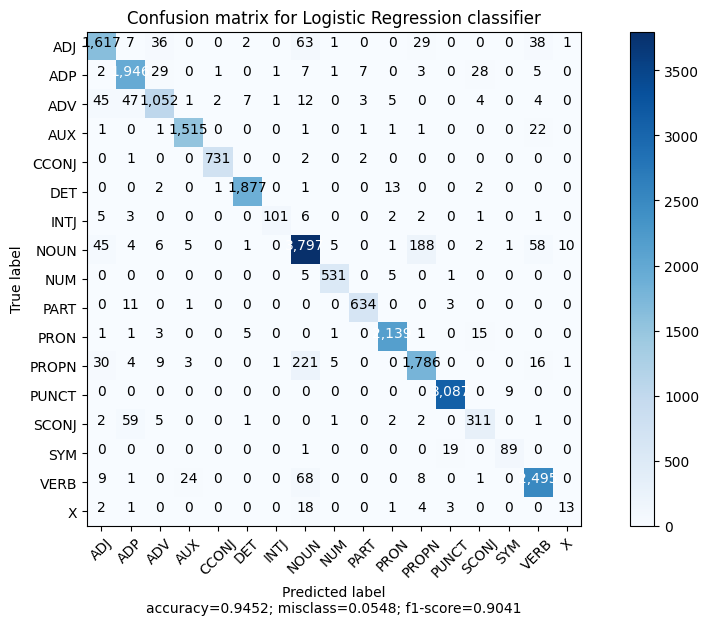

In [41]:
y_pred = clf.predict(X_test)
f1 = f1_score(y_test, y_pred, average='macro')
cnf_matrix = confusion_matrix(y_test, y_pred)
name='Logistic Regression'
plot_confusion_matrix(f1, cnf_matrix, target_names=classes, title='Confusion matrix for '+name+' classifier', normalize=False)

## Tag an Unknown Sentence

Lets try our trained tagger on new sentences.  To tag a sentence given as a string, we must apply the following steps:
* Tokenize the string into a list of tokens
* Turn each token into a features dictionary (using the features used by our model)
* Turn the list of feature dictionaries into vectors (using scikit-learn vectorization method)
* Pass the resulting matrix (one row vector for each token) to the classifier.

In [42]:
# Need to download the nltk model for sentence tokenizer
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt_tab.zip.


True

In [43]:
tokens = nltk.word_tokenize('Word embeddings provide a dense representation of words and their relative meanings.')
print(tokens)

['Word', 'embeddings', 'provide', 'a', 'dense', 'representation', 'of', 'words', 'and', 'their', 'relative', 'meanings', '.']


In [44]:
X_features = transform_test_sentence(tokens)

In [45]:
X_features

[[{'nb_terms': 13,
   'word': 'Word',
   'word_lower': 'word',
   'is_first': True,
   'is_last': False,
   'is_capitalized': True,
   'is_all_caps': False,
   'is_all_lower': False,
   'prefix-1': 'W',
   'prefix-2': 'Wo',
   'prefix-3': 'Wor',
   'suffix-1': 'd',
   'suffix-2': 'rd',
   'suffix-3': 'ord',
   'i-1_prefix-3': '',
   'i-1_suffix-3': '',
   'i+1_prefix-3': 'emb',
   'i+1_suffix-3': 'ngs',
   'prev_word': '',
   'next_word': 'embeddings',
   'has_hyphen': False,
   'is_numeric': False,
   'capitals_inside': False}],
 [{'nb_terms': 13,
   'word': 'embeddings',
   'word_lower': 'embeddings',
   'is_first': False,
   'is_last': False,
   'is_capitalized': False,
   'is_all_caps': False,
   'is_all_lower': True,
   'prefix-1': 'e',
   'prefix-2': 'em',
   'prefix-3': 'emb',
   'suffix-1': 's',
   'suffix-2': 'gs',
   'suffix-3': 'ngs',
   'i-1_prefix-3': 'Wor',
   'i-1_suffix-3': 'ord',
   'i+1_prefix-3': 'pro',
   'i+1_suffix-3': 'ide',
   'prev_word': 'word',
   'next_word'

In [46]:
X_vectorized = vec.transform([x[0] for x in X_features])

In [47]:
# The vectorized sentence is a sparse matrix with one row for each token and columns for the vectorized features
# For example, if the vocabulary has 1000 unique words, the vectorized sentence will have 1000 columns for each word feature.
# This is a very sparse matrix, where most of the values are zero.
X_vectorized.shape

(13, 98724)

In [48]:
pred = clf.predict(X_vectorized)

In [49]:
# np.str_ is a subclass of str that is used to represent string arrays in NumPy.
print('Here is what our LR tagger predicts for the test sentence:\n',list(zip(tokens, pred)))

Here is what our LR tagger predicts for the test sentence:
 [('Word', 'PROPN'), ('embeddings', 'NOUN'), ('provide', 'VERB'), ('a', 'DET'), ('dense', 'ADJ'), ('representation', 'NOUN'), ('of', 'ADP'), ('words', 'NOUN'), ('and', 'CCONJ'), ('their', 'PRON'), ('relative', 'ADJ'), ('meanings', 'NOUN'), ('.', 'PUNCT')]


Let's turn this process into a prediction function from a sentence encoded as a single string to a list of pairs (token, predicted_tag):

In [50]:
def predict_sentence(sentence):
   tokens = nltk.word_tokenize(sentence)
   X_features = transform_test_sentence(tokens)
   X_vectorized = vec.transform([x[0] for x in X_features])
   pred = clf.predict(X_vectorized)
   return list(zip(tokens, pred))

In [51]:
predict_sentence("Let me join the chorus of annoyance over Google's new toolbar , which, as noted in the linked article, commits just about every sin an online marketer could commit, and makes up a few new ones besides.")

[('Let', 'VERB'),
 ('me', 'PRON'),
 ('join', 'VERB'),
 ('the', 'DET'),
 ('chorus', 'NOUN'),
 ('of', 'ADP'),
 ('annoyance', 'NOUN'),
 ('over', 'ADP'),
 ('Google', 'PROPN'),
 ("'s", 'PART'),
 ('new', 'ADJ'),
 ('toolbar', 'NOUN'),
 (',', 'PUNCT'),
 ('which', 'PRON'),
 (',', 'PUNCT'),
 ('as', 'SCONJ'),
 ('noted', 'VERB'),
 ('in', 'ADP'),
 ('the', 'DET'),
 ('linked', 'VERB'),
 ('article', 'NOUN'),
 (',', 'PUNCT'),
 ('commits', 'NOUN'),
 ('just', 'ADV'),
 ('about', 'ADV'),
 ('every', 'DET'),
 ('sin', 'VERB'),
 ('an', 'DET'),
 ('online', 'ADJ'),
 ('marketer', 'NOUN'),
 ('could', 'AUX'),
 ('commit', 'VERB'),
 (',', 'PUNCT'),
 ('and', 'CCONJ'),
 ('makes', 'VERB'),
 ('up', 'ADP'),
 ('a', 'DET'),
 ('few', 'ADJ'),
 ('new', 'ADJ'),
 ('ones', 'NOUN'),
 ('besides', 'ADP'),
 ('.', 'PUNCT')]

# Collect Hard Sentences

Hard sentences are sentences that contain multiple wrongly predicted tags given our classifier.

Write code to collect hard sentences given a classifier clf.

In [52]:
def errors_in_sentence_prediction(clf, tagged_sentence):
    """
    Given a tagged sentence from the dataset, return the number of errors and the predicted tags.
    
    Args:
        clf: The trained Logistic Regression classifier
        tagged_sentence: A sentence with ground truth tags from the UD dataset
            (typically a list of (word, tag) tuples)
    
    Returns:
        errors: The number of errors in the predicted tags
        pred: The list of predicted tags
    """
    # add debug prints 
    print("Tagged Sentence:", tagged_sentence)
    # Extract true tags for later comparison
    true_tags = [tag for _, tag in tagged_sentence]
    print(f"true tags: {true_tags}")
    # Convert single sentence to features format expected by the classifier
    # This creates a list of (features_dict, tag) tuples similar to transform_to_dataset
    X_sentence, _ = transform_to_dataset([tagged_sentence])
    print(f"X_s {X_sentence}")
    # Use the same vectorizer that was used in training
    X_sentence_vectorized = vec.transform([x[0] for x in X_sentence])
    
    # Make predictions
    pred = clf.predict(X_sentence_vectorized)
    
    # Count errors by comparing predictions to true tags
    errors = sum(1 for i, tag in enumerate(true_tags) if pred[i] != tag)
    
    return errors, pred

In [53]:
hard_sentences = []
for s in test_sentences:
    errors, pred = errors_in_sentence_prediction(clf, s)
    if errors > 0:
        hard_sentences.append((s, errors, pred))
print(f'Number of sentences with errors: {len(hard_sentences)} out of {len(test_sentences)}')

Tagged Sentence: [('What', 'PRON'), ('if', 'SCONJ'), ('Google', 'PROPN'), ('Morphed', 'VERB'), ('Into', 'ADP'), ('GoogleOS', 'PROPN'), ('?', 'PUNCT')]
true tags: ['PRON', 'SCONJ', 'PROPN', 'VERB', 'ADP', 'PROPN', 'PUNCT']
X_s [[{'nb_terms': 7, 'word': 'What', 'word_lower': 'what', 'is_first': True, 'is_last': False, 'is_capitalized': True, 'is_all_caps': False, 'is_all_lower': False, 'prefix-1': 'W', 'prefix-2': 'Wh', 'prefix-3': 'Wha', 'suffix-1': 't', 'suffix-2': 'at', 'suffix-3': 'hat', 'i-1_prefix-3': '', 'i-1_suffix-3': '', 'i+1_prefix-3': 'if', 'i+1_suffix-3': 'if', 'prev_word': '', 'next_word': 'if', 'has_hyphen': False, 'is_numeric': False, 'capitals_inside': False}], [{'nb_terms': 7, 'word': 'if', 'word_lower': 'if', 'is_first': False, 'is_last': False, 'is_capitalized': False, 'is_all_caps': False, 'is_all_lower': True, 'prefix-1': 'i', 'prefix-2': 'if', 'prefix-3': 'if', 'suffix-1': 'f', 'suffix-2': 'if', 'suffix-3': 'if', 'i-1_prefix-3': 'Wha', 'i-1_suffix-3': 'hat', 'i+1_p

Draw a histogram showing how the sentences in the test dataset are distributed in terms of prediction errors per sentence.

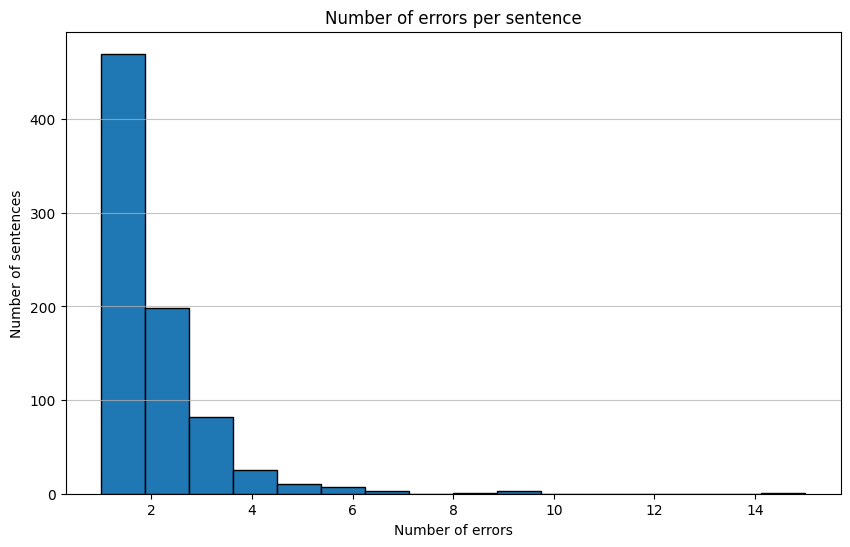

In [54]:
# Draw a histogram of the number of errors per sentence
plt.figure(figsize=(10, 6))
plt.hist([x[1] for x in hard_sentences], bins=16, edgecolor='black')
plt.title('Number of errors per sentence')
plt.xlabel('Number of errors')
plt.ylabel('Number of sentences')
plt.grid(axis='y', alpha=0.75)
plt.show()

In [55]:
# Show prediction errors for sentences with more than 5 errors.
for s in hard_sentences:
    if s[1] > 5:
        print(" ".join(untag(s[0])))
        print('Number of errors:', s[1])
        for i in range(len(s[0])):
            if s[0][i][1] != s[2][i]:
                print(f'{s[0][i][0]:<20}  C: {s[0][i][1]:<12}  P: {s[2][i]:<12} **** Error')
            else:
                print(f'{s[0][i][0]:<23}  {s[0][i][1]:<12}')
        print(40*'=')


Stay with me now : John Paul STEVENS delivered the opinion of the Court with respect to Parts I through IV , VI through VI - D - iii , VI - D - v , and VII , in which KENNEDY , SOUTER , GINSBURG , and BREYER joined , and an opinion with respect to Parts V and VI - D - iv , in which SOUTER , GINSBURG , and BREYER joined .
Number of errors: 8
Stay                     VERB        
with                     ADP         
me                       PRON        
now                      ADV         
:                        PUNCT       
John                     PROPN       
Paul                     PROPN       
STEVENS               C: PROPN         P: NOUN         **** Error
delivered                VERB        
the                      DET         
opinion                  NOUN        
of                       ADP         
the                      DET         
Court                    NOUN        
with                     ADP         
respect                  NOUN        
to                   

## 

## Error Analysis

1. Identify tokens that are misclassified more than 10 times in the test set. Print the sentences where the errors are predicted (about 100 sentences).
2. Provide a possible reason why these errors are made by the tagger based on your understanding of the knowledge needed to correctly tag these tokens.
3. Based on this error analysis, invent five sentences that are badly tagged. Explain what is your method to create these hard examples.


In [83]:
# Collect sentences with 1 to 3 errors
sentences_with_few_errors = []
for s in hard_sentences:
    if 1 <= s[1] <= 3:
        sentences_with_few_errors.append(s)

# Print the sentences and their errors
for s, errors, pred in sentences_with_few_errors:
    print(" ".join(untag(s)))
    print("Number of errors:", errors)
    for i in range(len(s)):
        if s[i][1] != pred[i]:
            print(f"{s[i][0]:<20}  C: {s[i][1]:<12}  P: {pred[i]:<12} **** Error")
        else:
            print(f"{s[i][0]:<23}  {s[i][1]:<12}")
    print("=" * 40)
print(f"Number of sentences with 1 to 3 errors: {len(sentences_with_few_errors)} out of {len(test_sentences)}")
# Show the first 5 sentences with errors    
for s in sentences_with_few_errors[:5]:
    print(" ".join(untag(s[0])))
    print('Number of errors:', s[1])
    for i in range(len(s[0])):
        if s[0][i][1] != s[2][i]:
            print(f'{s[0][i][0]:<20}  C: {s[0][i][1]:<12}  P: {s[2][i]:<12} **** Error')
        else:
            print(f'{s[0][i][0]:<23}  {s[0][i][1]:<12}')
    print(40*'=')

What if Google expanded on its search - engine ( and now e-mail ) wares into a full - fledged operating system ?
Number of errors: 3
What                     PRON        
if                       SCONJ       
Google                   PROPN       
expanded                 VERB        
on                       ADP         
its                      PRON        
search                   NOUN        
-                        PUNCT       
engine                   NOUN        
(                        PUNCT       
and                      CCONJ       
now                      ADV         
e-mail                   NOUN        
)                        PUNCT       
wares                 C: NOUN          P: VERB         **** Error
into                     ADP         
a                        DET         
full                  C: ADV           P: ADJ          **** Error
-                        PUNCT       
fledged               C: ADJ           P: VERB         **** Error
operating              

In [ ]:
# Create a dictionary mapping each error word (w, tag) to a list of misclassified sentences containing it
error_words = error_counter.most_common(10)
error_word_set = set(w.lower() for w, _ in error_words)

missclassified_sentences = {}

for sentence in test_sentences:
    # Process each sentence only once
    # Transform and vectorize the sentence once
    X_sentence, _ = transform_to_dataset([sentence])
    X_sentence_vectorized = vec.transform([x[0] for x in X_sentence])
    pred_tags = clf.predict(X_sentence_vectorized)

    # Count all errors in this sentence
    error_count = 0
    sentence_errors = []

    # Compare predicted tags with gold tags for the entire sentence
    for idx, (word, gold_tag) in enumerate(sentence):
        if word.lower() in error_word_set and pred_tags[idx] != gold_tag:
            error_count += 1
            sentence_errors.append((word, pred_tags[idx]))

    # Only add sentences with 1-3 errors
    if 1 <= error_count <= 3:
        for word, pred_tag in sentence_errors:
            key = (word, pred_tag)
            if key not in missclassified_sentences:
                missclassified_sentences[key] = []
            missclassified_sentences[key].append(sentence)

n_sentences = 0
for key, val in missclassified_sentences.items():
    n_sentences += len(val)



194 sentences with 1-3 errors for the most common error words
750


The Logistic Regression POS tagger frequently misclassifies certain words primarily due to **ambiguity** and the **limitations of local features**. These words can function as multiple parts-of-speech, and the features used (like the word itself, surrounding words, prefixes/suffixes) often fail to capture the broader sentence structure needed for correct disambiguation.

Here's a breakdown of the top error words and common confusions:

1.  **'that'**: Confused between Pronoun (PRON), Subordinating Conjunction (SCONJ), Determiner (DET), and Adverb (ADV). Requires understanding clause structure.
2.  **'to'**: Confused between Preposition (ADP) before nouns and Infinitive Marker (PART) before verbs. Highly dependent on the following word.
3.  **'as'**: Confused between Preposition (ADP), Subordinating Conjunction (SCONJ), and Adverb (ADV). Complex syntactic roles are hard to capture locally.
4.  **'like'**: Extremely ambiguous (ADP, VERB, SCONJ, ADJ, INTJ). Simple features struggle, especially with informal uses.
5.  **'out' / 'up'**: Confused between Preposition (ADP) and Adverb (ADV), especially within phrasal verbs. Identifying phrasal verbs and object placement is difficult with local features. Compounds (e.g., "check-out") are also missed.
6.  **'/'**: Confused between general Punctuation (PUNCT) and Symbol (SYM) depending on context (units, alternatives).
7.  **'for'**: Confused between Preposition (ADP) and Subordinating Conjunction (SCONJ), particularly in "for...to..." structures.
8.  **'in' / 'on'**: Confused between Preposition (ADP) and Adverb (ADV) in phrasal verbs or specific constructions (e.g., "in + gerund", "clothes on").

In summary, these errors highlight the need for more sophisticated features or models that can better analyze syntactic relationships and context beyond a small local window.

**Method:** The method involves intentionally using words identified as frequent sources of errors (like 'that', 'to', 'like', 'out', 'for', '/') in ambiguous contexts or less common grammatical structures that the local features might misinterpret. We combine multiple such challenges where possible.

**Hard Sentences:**

1.  **Sentence:** "The fact **that** **that** report was late forced us **to** push the meeting **out**."
    *   **Challenges:**
        *   `that` (SCONJ) followed immediately by `that` (DET) - likely confusion.
        *   `to` (PART) followed by a verb (`push`).
        *   `out` (ADP) as part of a phrasal verb (`push out`). The tagger might confuse ADP/ADV.
2.  **Sentence:** "His desire **to** **to**p the performance chart is clear, **as** is his need **for** recognition."
    *   **Challenges:**
        *   `to` (ADP) followed by `to` (PART) where 'top' could be mistaken for a noun locally.
        *   `as` (SCONJ/ADP) in a comparative structure.
        *   `for` (ADP) followed by a noun.
3.  **Sentence:** "I **like** how you act **like** you don't **like** **that**, **like**, at all."
    *   **Challenges:**
        *   `like` (VERB).
        *   `like` (SCONJ) introducing a clause.
        *   `like` (VERB) again.
        *   `that` (PRON/DET).
        *   `like` (INTJ) - informal usage, very hard for this type of tagger.
4.  **Sentence:** "They need **to** figure **out** the input **/** output format **for** the system **to** work."
    *   **Challenges:**
        *   `to` (PART) followed by verb.
        *   `out` (ADP) in a phrasal verb.
        *   `/` (SYM) connecting related nouns - might be tagged as PUNCT.
        *   `for` (SCONJ) introducing the infinitive clause "for the system to work" - often mistaken for ADP.
        *   `to` (PART) following the SCONJ 'for'.
5.  **Sentence:** "Set the timer **for** five minutes, **for** we need **to** leave soon, turn the light **on**."
    *   **Challenges:**
        *   `for` (ADP) indicating duration.
        *   `for` (CCONJ/SCONJ) used as a conjunction meaning 'because' - rare and likely misclassified as ADP.
        *   `to` (PART) infinitive marker.
        *   `on` (ADV/ADP) part of phrasal verb 'turn on', separated from verb - likely confused.

In [123]:
from ud_pos_tagger_gemini import TaggedSentences,tag_sentences_ud
import random
untag_sentences = []
for key, val in missclassified_sentences.items():
    untag_sentence = [untag(sentence) for sentence in val]
    untag_sentences.append(untag_sentence)

    # Group untagged sentences into batches of 5 for LLM analysis
    batch_size = 5
    # Flatten all untagged sentences into a single list
    all_untagged = [sent for group in untag_sentences for sent in group]

    # Shuffle the sentences to remove any context or grouping by error word
    # random.shuffle(all_untagged)

    # Group into batches of 5
    batch_size = 5
    batched_sentences = []
    for i in range(0, len(all_untagged), batch_size):
        batch = all_untagged[i:i+batch_size]
        batch_str = "\n".join(" ".join(sent) for sent in batch)
        print(batch_str)
        print("-" * 40)
        batched_sentences.append(batch)
print(untag_sentences)
print("Total number of sentences:", len(all_untagged))
print("Total number of batches:", len(batched_sentences))

I doubt the very few who actually read my blog have not come across this yet , but I figured I would put it out there anyways .
in n out of the chicago area ?
I 'm under 21 + and looking for a nice place to take my boyfriend out for dinner where they play music and there is a dance floor .
i would like to have one of those super random surprisingly nice nights out ... suggestions ?
I have a friend out in Chicago this week , and I am trying to remember the name of an awesome hibachi style restaurant i visited while out there a couple years ago .
----------------------------------------
I have a friend out in Chicago this week , and I am trying to remember the name of an awesome hibachi style restaurant i visited while out there a couple years ago .
The door is easy to use and it keeps the cold out during the winter .
We at R&L Plumbing Services are pleased with your professionalism and the extra mile you went to get out computers working correctly , you will be our first call if anythin

In [92]:
# send the first bacth to the LLM for analysis

tagged_results : TaggedSentences = None

for batch in batched_sentences:
    if tagged_results is None:
        tagged_results = tag_sentences_ud(batch)
    else:
        new_tag_results = tag_sentences_ud(batch)
        tagged_results.sentences.extend(new_tag_results.sentences)



if tagged_results.sentences:
    print("\n--- Tagging Results ---")
    for sentence in tagged_results.sentences:
        print(f"\nSentence: {sentence.text if sentence.text else 'N/A'}")
        print("-" * 50)
        for token_pos in sentence.tokens:
            token = token_pos.token
            tag = token_pos.pos_tag

            # Handle potential None for pos_tag if model couldn't assign one
            ctag = tag if tag is not None else "UNKNOWN"
            print(f"Token: {token:<15} {str(ctag)}")
        print("-" * 50)
else:
    print("\nFailed to get POS tagging results.")


#

{
  "sentences": [
    {
      "tokens": [
        {
          "token": "I",
          "pos_tag": "PRON"
        },
        {
          "token": "doubt",
          "pos_tag": "VERB"
        },
        {
          "token": "the",
          "pos_tag": "DET"
        },
        {
          "token": "very",
          "pos_tag": "ADV"
        },
        {
          "token": "few",
          "pos_tag": "ADJ"
        },
        {
          "token": "who",
          "pos_tag": "PRON"
        },
        {
          "token": "actually",
          "pos_tag": "ADV"
        },
        {
          "token": "read",
          "pos_tag": "VERB"
        },
        {
          "token": "my",
          "pos_tag": "PRON"
        },
        {
          "token": "blog",
          "pos_tag": "NOUN"
        },
        {
          "token": "have",
          "pos_tag": "AUX"
        },
        {
          "token": "not",
          "pos_tag": "PART"
        },
        {
          "token": "come",
          "pos_ta

In [93]:

# Create a lookup for original tagged sentences based on their untagged form
# Use tuples of tokens as keys because lists are not hashable
test_sentences_lookup = {tuple(untag(ts)): ts for ts in test_sentences}

print("\n--- Comparison with Ground Truth (Original Test Set) ---")

if tagged_results:
    # Use the first batch from batched_sentences
    batch = batched_sentences[0] if len(batched_sentences) > 0 else []
    # Iterate through the sentences as processed by the LLM
    for i, predicted_sentence_obj in enumerate(tagged_results.sentences):
        # Get the corresponding untagged sentence (list of tokens) from the input batch
        # Ensure batch contains lists of tokens, not strings
        if i < len(batch) and isinstance(batch[i], list):
            untagged_sent_tokens = batch[i]
        else:
            # Fallback if batch structure is different (e.g., strings)
            print(
                f"Warning: Unexpected format for batch[{i}]. Trying to tokenize predicted text."
            )
            if predicted_sentence_obj.text:
                untagged_sent_tokens = nltk.word_tokenize(predicted_sentence_obj.text)
            else:
                # Reconstruct from tokens if text is None
                untagged_sent_tokens = [
                    tp.token for tp in predicted_sentence_obj.tokens
                ]

        print(f"\nComparing Sentence: {' '.join(untagged_sent_tokens)}")
        print("-" * 60)

        # Find the original tagged sentence from the test set using the untagged tokens
        original_tagged_sentence = test_sentences_lookup.get(
            tuple(untagged_sent_tokens)
        )

        if original_tagged_sentence:
            # Extract ground truth tags
            ground_truth_tags = [tag for _, tag in original_tagged_sentence]
            # Extract predicted tags (handle potential None and convert enum to string)
            predicted_tags = []
            for token_pos in predicted_sentence_obj.tokens:
                tag = token_pos.pos_tag
                # Convert UDPosTag enum to string (e.g., UDPosTag.NOUN -> "NOUN")
                pred_tag_str = str(tag).split(".")[-1] if tag is not None else "UNKNOWN"
                predicted_tags.append(pred_tag_str)

            print(
                f"{'Token':<15} {'LLM Prediction':<15} {'Ground Truth':<15} {'Match'}"
            )
            print("-" * 60)

            # Compare token by token
            num_tokens = max(len(predicted_tags), len(ground_truth_tags))
            for j in range(num_tokens):
                token = (
                    untagged_sent_tokens[j] if j < len(untagged_sent_tokens) else "N/A"
                )
                pred_tag = predicted_tags[j] if j < len(predicted_tags) else "N/A"
                true_tag = ground_truth_tags[j] if j < len(ground_truth_tags) else "N/A"
                match_status = ""
                if pred_tag != "N/A" and true_tag != "N/A":
                    match_status = "✅" if pred_tag == true_tag else "❌"

                print(f"{token:<15} {pred_tag:<15} {true_tag:<15} {match_status}")
            print("-" * 60)
        else:
            print(
                f"Could not find the original tagged sentence in the test set for: {' '.join(untagged_sent_tokens)}"
            )
            print("-" * 60)

else:
    print("\nNo tagging results available for comparison.")

# ... existing code ...
# print("Tagging result:", tagged_result) # This line can be kept or removed


--- Comparison with Ground Truth (Original Test Set) ---

Comparing Sentence: I doubt the very few who actually read my blog have not come across this yet , but I figured I would put it out there anyways .
------------------------------------------------------------
Token           LLM Prediction  Ground Truth    Match
------------------------------------------------------------
I               PRON            PRON            ✅
doubt           VERB            VERB            ✅
the             DET             DET             ✅
very            ADV             ADV             ✅
few             ADJ             ADJ             ✅
who             PRON            PRON            ✅
actually        ADV             ADV             ✅
read            VERB            VERB            ✅
my              PRON            PRON            ✅
blog            NOUN            NOUN            ✅
have            AUX             AUX             ✅
not             PART            PART            ✅
come            V

[(('i', 'doubt', 'the', 'very', 'few', 'who', 'actually', 'read', 'my', 'blog', 'have', 'not', 'come', 'across', 'this', 'yet', ',', 'but', 'i', 'figured', 'i', 'would', 'put', 'it', 'out', 'there', 'anyways', '.'), ['PRON', 'VERB', 'DET', 'ADV', 'ADJ', 'PRON', 'ADV', 'VERB', 'PRON', 'NOUN', 'AUX', 'PART', 'VERB', 'ADP', 'DET', 'ADV', 'PUNCT', 'CCONJ', 'PRON', 'VERB', 'PRON', 'AUX', 'VERB', 'PRON', 'ADP', 'ADV', 'ADV', 'PUNCT']), (('in', 'n', 'out', 'of', 'the', 'chicago', 'area', '?'), ['ADP', 'X', 'ADP', 'ADP', 'DET', 'PROPN', 'NOUN', 'PUNCT']), (('i', "'m", 'under', '21', '+', 'and', 'looking', 'for', 'a', 'nice', 'place', 'to', 'take', 'my', 'boyfriend', 'out', 'for', 'dinner', 'where', 'they', 'play', 'music', 'and', 'there', 'is', 'a', 'dance', 'floor', '.'), ['PRON', 'AUX', 'ADP', 'NUM', 'SYM', 'CCONJ', 'VERB', 'ADP', 'DET', 'ADJ', 'NOUN', 'PART', 'VERB', 'PRON', 'NOUN', 'ADP', 'ADP', 'NOUN', 'SCONJ', 'PRON', 'VERB', 'NOUN', 'CCONJ', 'ADV', 'AUX', 'DET', 'NOUN', 'NOUN', 'PUNCT']

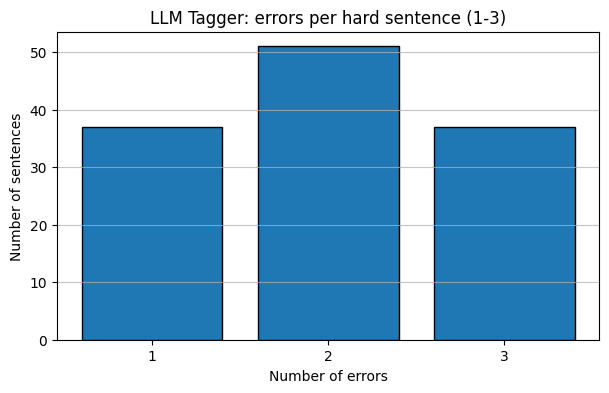

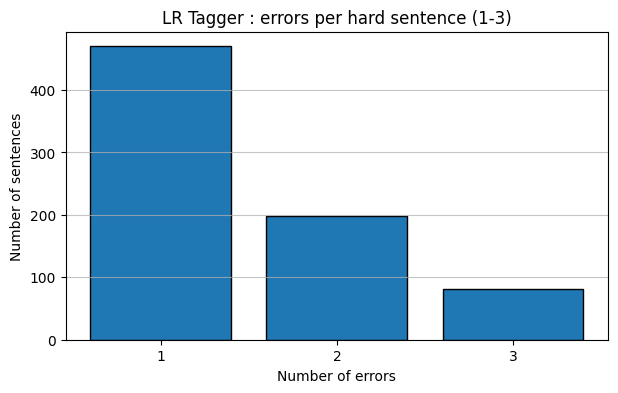

In [170]:
# ====================== 2.2  Error Analysis: LR vs. LLM on hard sentences ======================
import matplotlib.pyplot as plt
from collections import defaultdict

# ------------------------------------------------------------------
# 1.  Build a lookup  tuple(tokens) -> list[pred_tag]  from `tagged_results`
# ------------------------------------------------------------------
llm_pred_lookup = {}
for sent_obj in tagged_results.sentences:
    toks = tuple(tp.token.lower() for tp in sent_obj.tokens)
    tags = [
        str(tp.pos_tag).split(".")[-1] if tp.pos_tag is not None else "UNKNOWN"
        for tp in sent_obj.tokens
    ]
    llm_pred_lookup[toks] = tags
print(list(llm_pred_lookup.items())[:50])

sentences_list = []
for sentence in test_sentences:
    toks = [token.lower() for token, _ in sentence]
    if tuple(toks) in llm_pred_lookup:
        sentences_list.append(sentence)
    else:
        print(f"Warning: {toks} not found in LLM predictions.")

# Find all sentences present in llm_pred_lookup but not in sentences_list
sentences_list_tuples = set(tuple(token.lower() for token, _ in s) for s in sentences_list)
llm_only_sentences = [toks for toks in llm_pred_lookup if toks not in sentences_list_tuples]
print(llm_only_sentences[:10])
print(f"Number of sentences in LLM predictions but not in sentences_list: {len(llm_only_sentences)}")


# ------------------------------------------------------------------
# 3.  Sanity‑check alignment: every sentence must have equal lengths
# ------------------------------------------------------------------
for i, (g, lr, llm) in enumerate(zip(gold_tags_seq, lr_tags_seq, llm_tags_seq)):
    assert (
        len(g) == len(lr) == len(llm)
    ), f"Length mismatch in sentence {i}: gold={len(g)}, lr={len(lr)}, llm={len(llm)}"

# ------------------------------------------------------------------
# 4.  Compute token‑level statistics
# ------------------------------------------------------------------
stats = defaultdict(
    int
)  # keys: total_tokens, lr_errors, llm_errors, fixed_by_llm, llm_new_errors

for g_tags, lr_tags, llm_tags in zip(gold_tags_seq, lr_tags_seq, llm_tags_seq):
    for g, lr, llm in zip(g_tags, lr_tags, llm_tags):
        stats["total_tokens"] += 1
        if lr != g:
            stats["lr_errors"] += 1
            if llm == g:
                stats["fixed_by_llm"] += 1
        if llm != g:
            stats["llm_errors"] += 1
            if lr == g:
                stats["llm_new_errors"] += 1

# ------------------------------------------------------------------
# 5.  Sentence‑level LLM error counts
# ------------------------------------------------------------------
llm_sent_err_seq = [
    sum(g != l for g, l in zip(gold, llm))
    for gold, llm in zip(gold_tags_seq, llm_tags_seq)
]

# ------------------------------------------------------------------
# 6.  Print token‑level results
# ------------------------------------------------------------------
print("=== Token‑level statistics (hard sentences, 1–3 LR errors) ===")
for key in [
    "total_tokens",
    "lr_errors",
    "llm_errors",
    "fixed_by_llm",
    "llm_new_errors",
]:
    print(f"{key.replace('_',' ').title():<32}: {stats[key]}")


# ------------------------------------------------------------------
# 7.  Plot sentence‑level histograms
# ------------------------------------------------------------------
def plot_hist(errors, title):
    plt.figure(figsize=(7, 4))
    plt.hist(
        errors, bins=[0.5, 1.5, 2.5, 3.5], edgecolor="black", align="mid", rwidth=0.8
    )
    plt.title(title)
    plt.xlabel("Number of errors")
    plt.ylabel("Number of sentences")
    plt.xticks([1, 2, 3])
    plt.grid(axis="y", alpha=0.75)
    plt.show()


print("\n=== Sentence‑level error histograms ===")
plot_hist(llm_sent_err_seq, "LLM Tagger: errors per hard sentence (1‑3)")
plot_hist(lr_sent_err_seq, "LR Tagger : errors per hard sentence (1‑3)")